# DR Classification Demo

# Get Result

In [1]:
import cv2
import json
import requests
import urllib3

urllib3.disable_warnings()
s = requests.Session()
POWER_AI_VISION_API_URL = "https://129.40.124.165/powerai-vision/api/dlapis/3d84484b-50db-421d-ad86-e999640cb400"



def detect_objects(filename):

    with open(filename, 'rb') as f:
        # WARNING! verify=False is here to allow an untrusted cert!
        r = s.post(POWER_AI_VISION_API_URL,
                   files={'files': (filename, f)},
                   verify=False)

    return r.status_code, json.loads(r.text)

# Helper Functions

In [30]:
import cv2
import json
import requests
import json
import glob
import math
import os
import shutil
from IPython.display import clear_output, Image, display
import requests


WHITE = (255, 255, 255)
YELLOW = (66, 244, 238)
GREEN = (80, 220, 60)
LIGHT_CYAN = (255, 255, 224)
DARK_BLUE = (139, 0, 0)
GRAY = (128, 128, 128)

def classify_images(result, filename):
    image = cv2.imread(filename)

    # get dimensions of image
    dimensions = image.shape
 
    # height, width, number of channels in image
    FRAME_HEIGHT = image.shape[0]
    FRAME_WIDTH = image.shape[1]
    ROI_YMAX = int(round(FRAME_HEIGHT * 0.75))
    overlay = image.copy()

    fontface = cv2.FONT_HERSHEY_SIMPLEX
    fontscale = 1
    thickness = 1

    if 'classified' in result:
#        print("Got back %d objects" % len(jsonresp['classified']))
        obj = result['classified'] 
    for i in obj:
        DR0 = obj.get("DR_0", "")
        unknown = obj.get("_negative_","")
        DR34 = obj.get("DR_34", "")
        fontface = cv2.FONT_HERSHEY_SIMPLEX
        fontscale = 1
        thickness = 1
        if not (DR0 =="") and (unknown==""):
#            print("DR0")
            label = ("DR_0 "+"(%.2f"%(float(DR0)*100)+ "% )")
            cv2.rectangle(overlay,
                    (0, ROI_YMAX),
                    (FRAME_WIDTH, FRAME_HEIGHT), DARK_BLUE, cv2.FILLED)    
        elif not (DR34=="") and (unknown==""):
#            print("DR34")
            label = ("DR_34 "+"(%.2f"%(float(DR34)*100)+"% )")
            cv2.rectangle(overlay,
                    (0, ROI_YMAX),
                    (FRAME_WIDTH, FRAME_HEIGHT), DARK_BLUE, cv2.FILLED)    
        else:
#            print("Uncategorized")
            label= ("uncertain")
            cv2.rectangle(overlay,
                    (0, ROI_YMAX),
                    (FRAME_WIDTH, FRAME_HEIGHT), DARK_BLUE, cv2.FILLED)    


    # Shade region of interest (ROI). We're really just using the top line.
    alpha = 0.3
    cv2.addWeighted(overlay, alpha, image, 1-alpha, 0, image)
    cv2.putText(image, label, (30, ROI_YMAX + 80), fontface, 1.5, LIGHT_CYAN, 4, cv2.LINE_AA)

    filename_out = "output/output-" + os.path.basename(filename)
    cv2.imwrite(filename_out, image)

    _ret, image = cv2.imencode('.jpeg', image)
    display(Image(data=image))

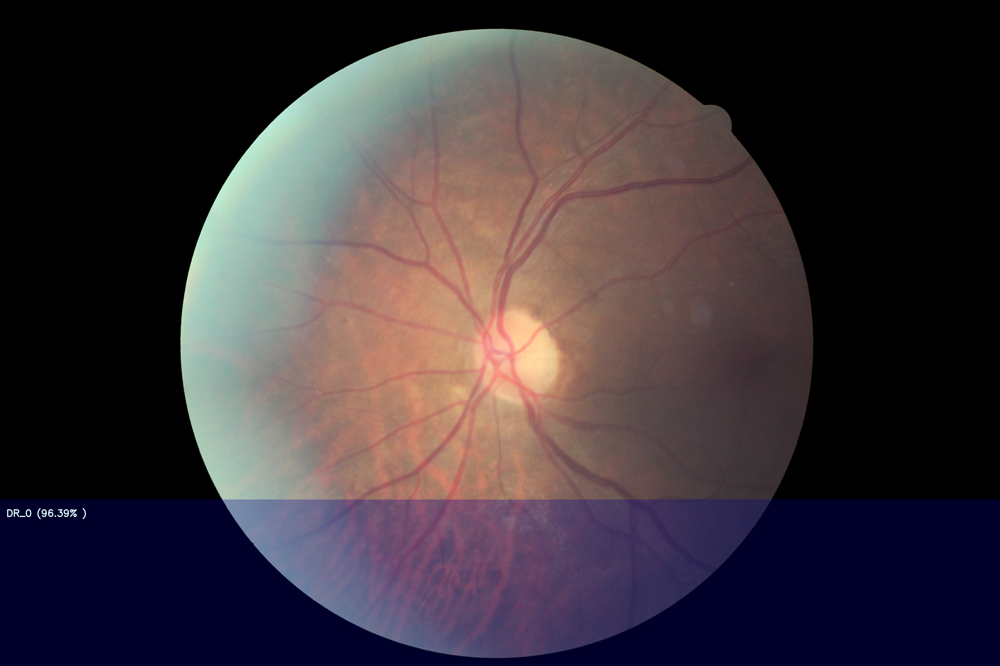

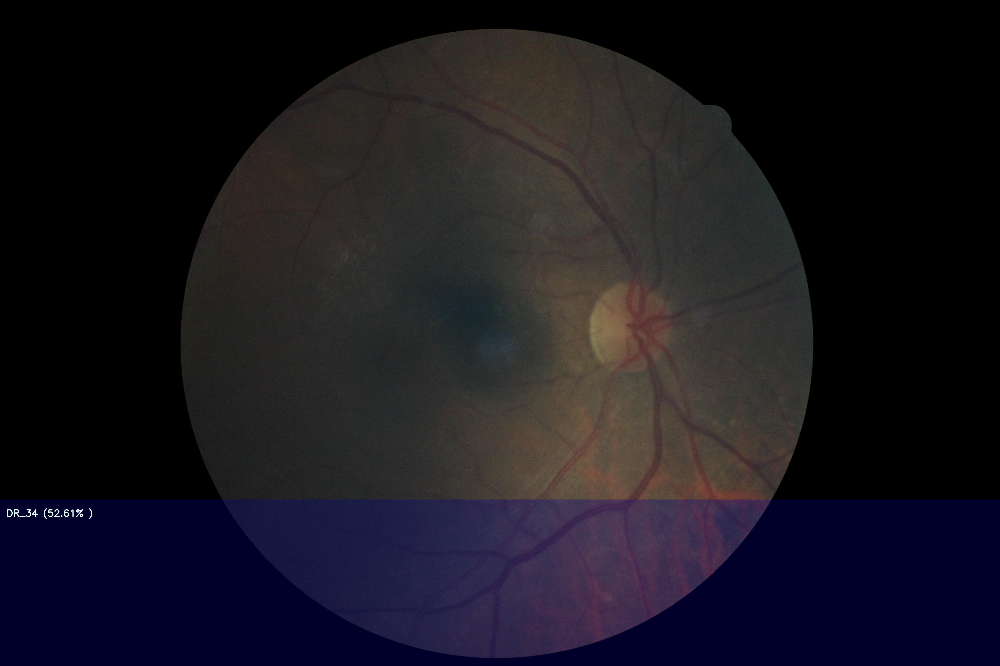

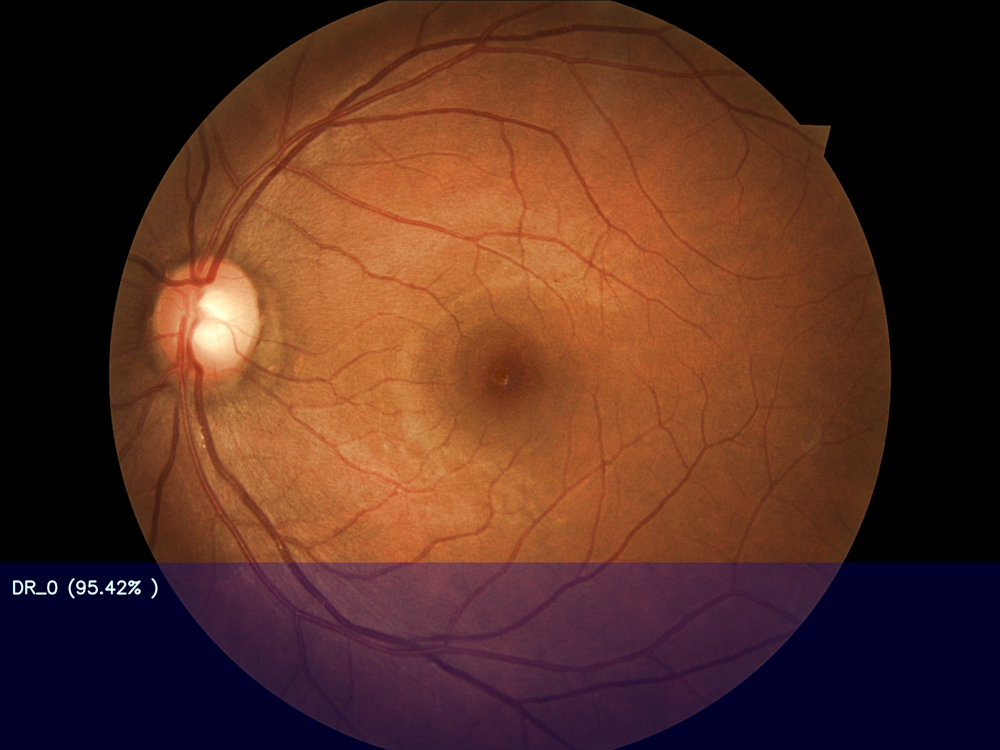

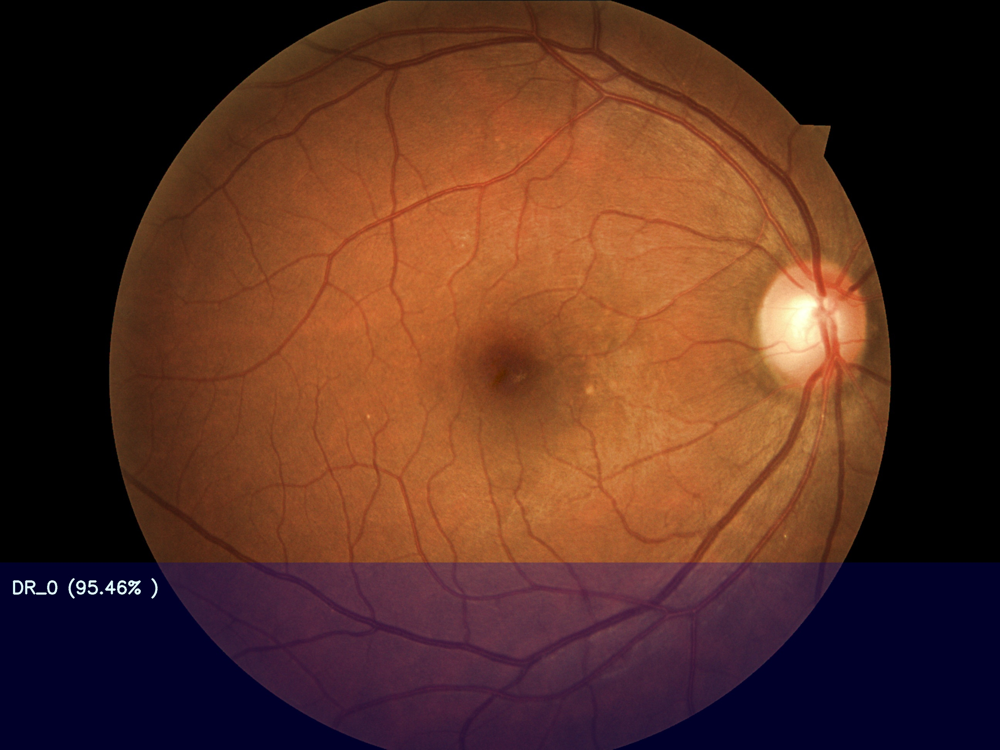

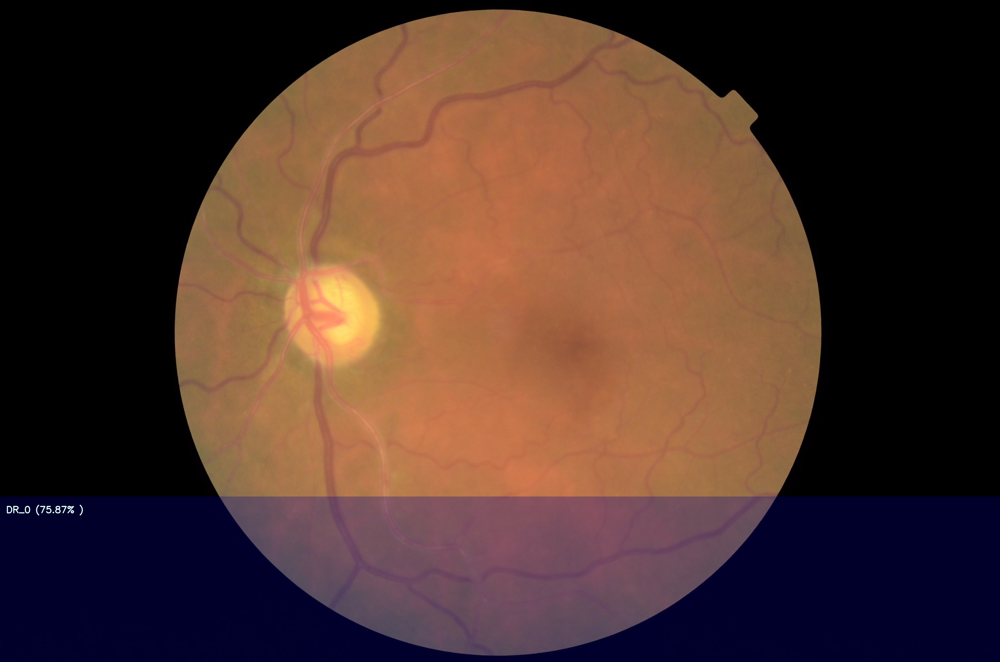

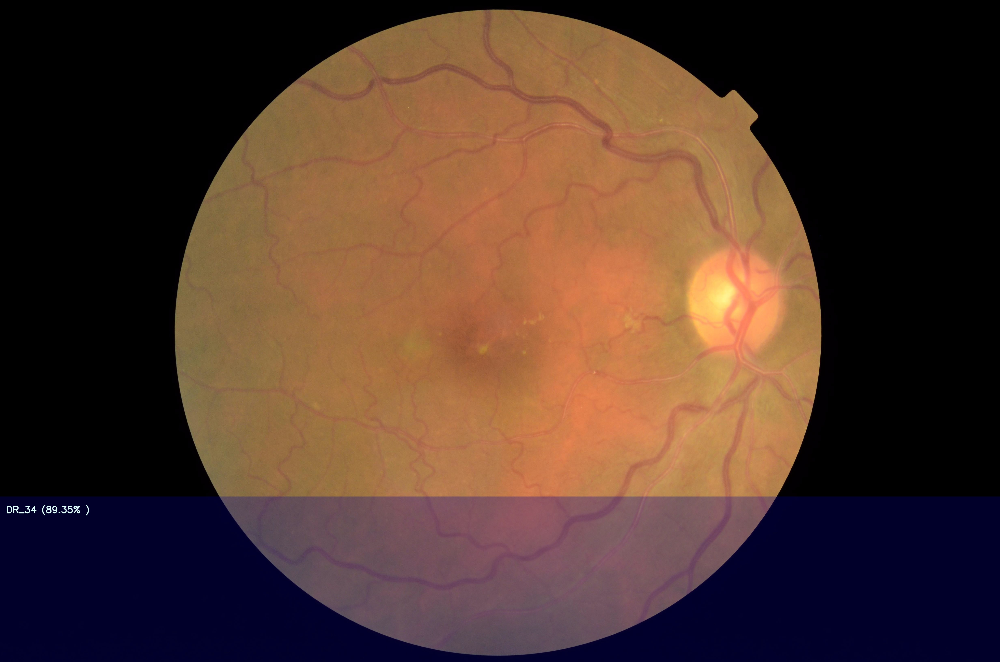

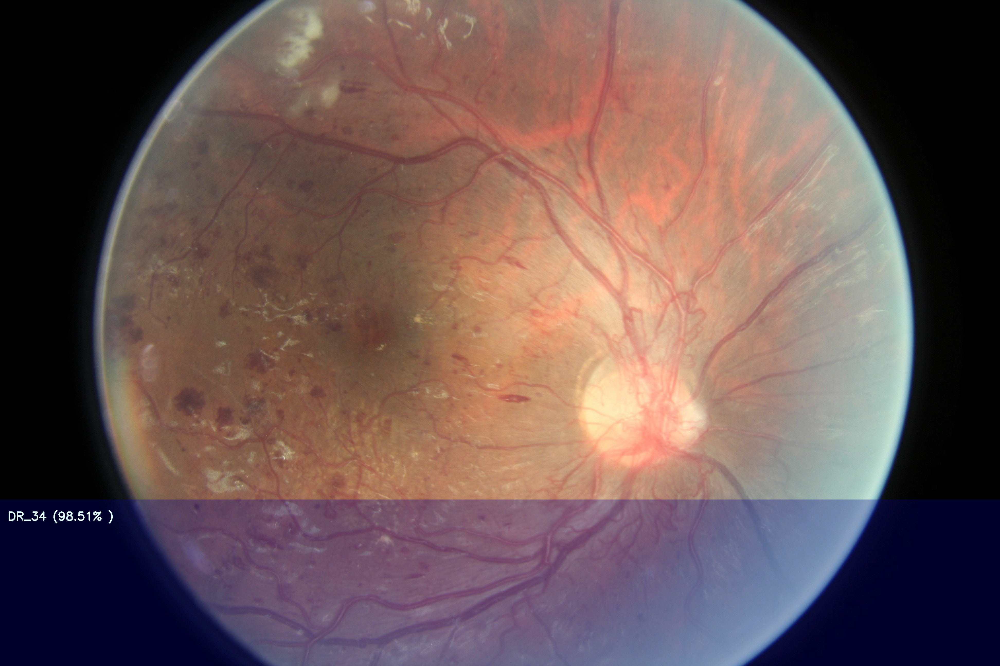

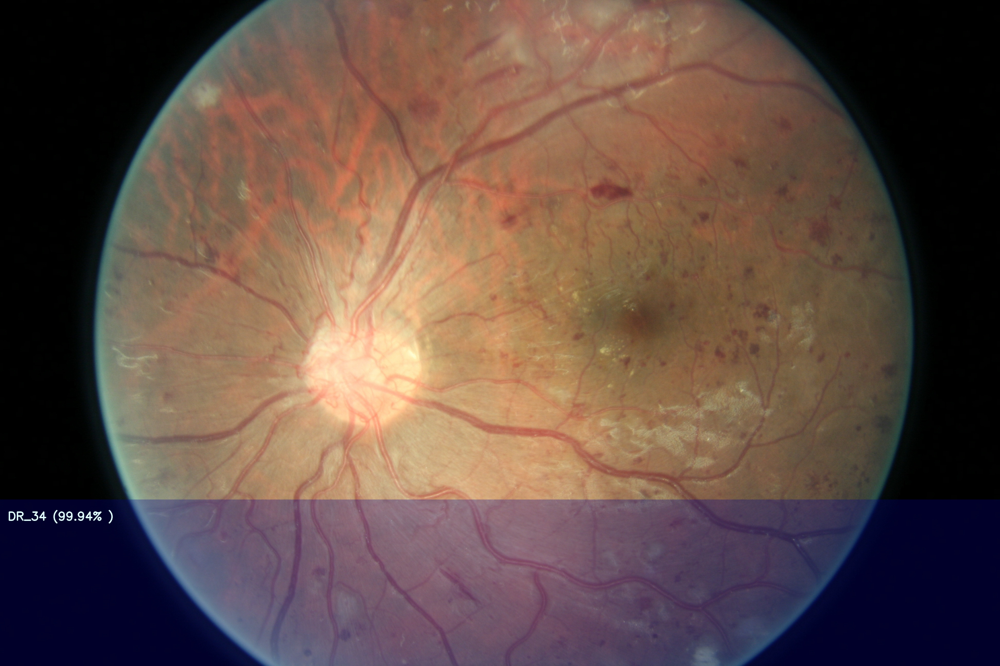

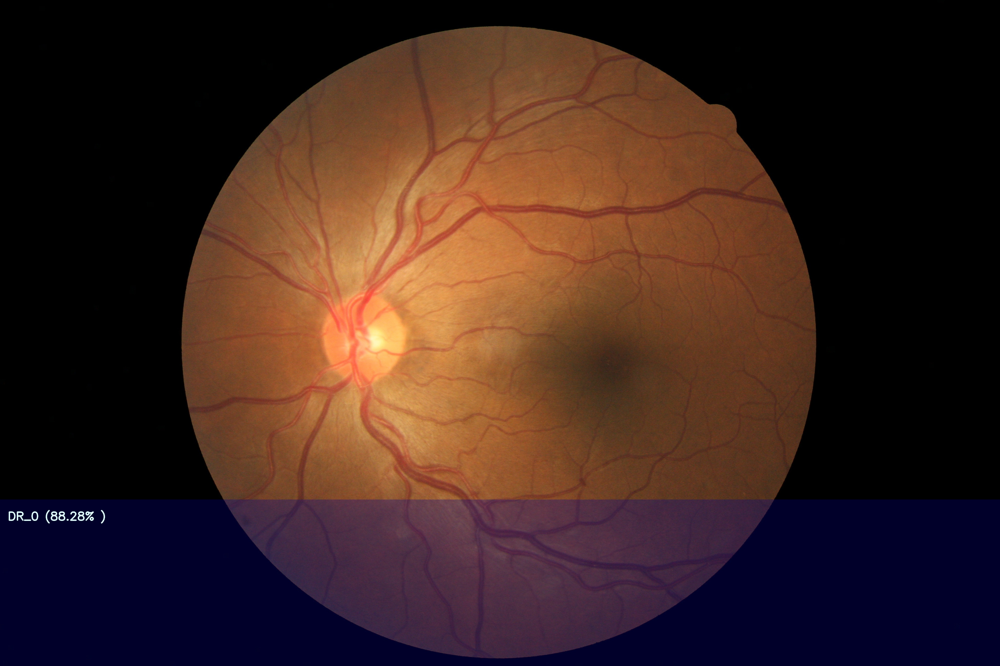

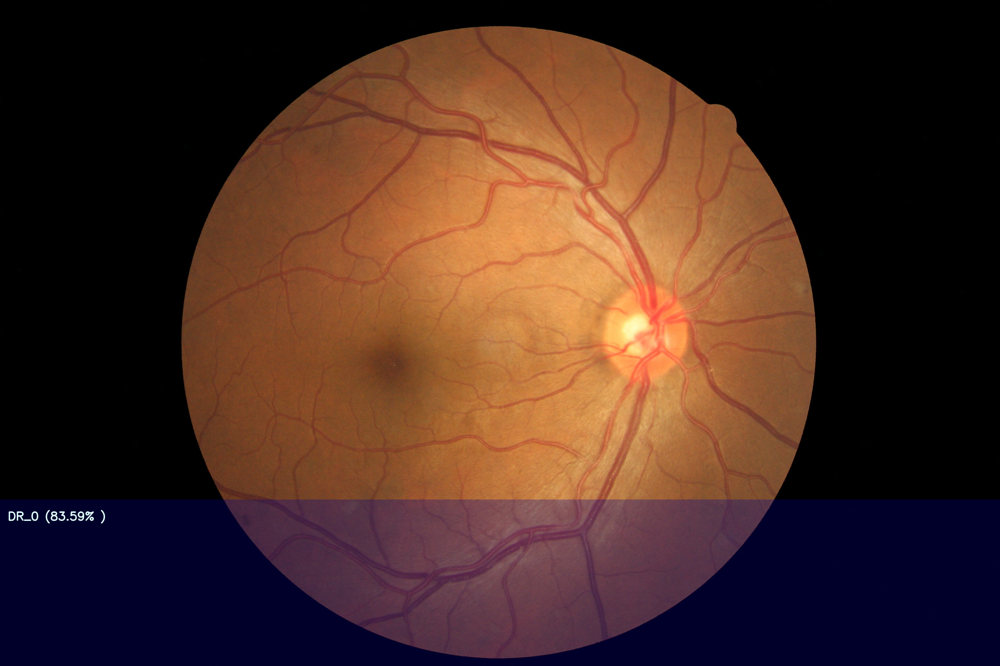


Done


In [32]:
i = 0

for filename in sorted(glob.glob('../sample/*.jpeg')):
    i += 1
    rc, results = detect_objects(filename)
    classify_images(results, filename)

print("\nDone")

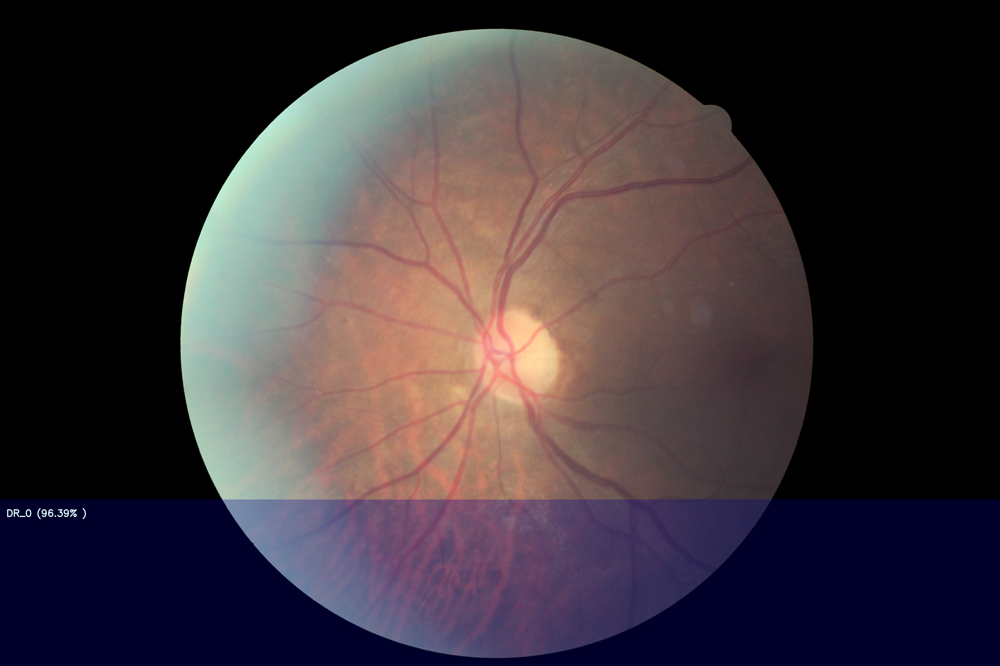


Done


In [31]:
i = 0

#filename = '/home/team5/gpfs/dr_data/trainDR4/16_left.jpeg'
filename = '../sample/10_left.jpeg'
#filename = '../dog-photo1.jpg'
rc, results = detect_objects(filename)
#print(results)

classify_images(results, filename)

print("\nDone")